<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#PlayGround" data-toc-modified-id="PlayGround-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>PlayGround</a></span></li><li><span><a href="#Main-code" data-toc-modified-id="Main-code-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Main code</a></span></li><li><span><a href="#Test" data-toc-modified-id="Test-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Test</a></span></li></ul></div>

# PlayGround

# Main code

In [89]:
from fastai.vision import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont

In [90]:
from fastai.callbacks import *
from fastai.vision.gan import *

In [ ]:
import os

os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [70]:
path = Path('data/')
path_hr = path/'normal'
path_lr = path/'crappy'

In [91]:
class crappifier(object):
    def __init__(self, path_lr, path_hr):
        self.path_lr = path_lr
        self.path_hr = path_hr

    def __call__(self, fn, i):
        dest = self.path_lr/fn.relative_to(self.path_hr)
        dest.parent.mkdir(parents=True, exist_ok=True)
        img = PIL.Image.open(fn).convert('L')
#         targ_sz = resize_to(img, 96, use_min=True)
#         img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
#         w, h = img.size
#         img = img.filter(ImageFilter.FIND_EDGES)
        img.save(dest)

In [92]:
il = ImageList.from_folder(path_hr)

In [93]:
il

ImageList (1918 items)
Image (3, 218, 178),Image (3, 218, 178),Image (3, 218, 178),Image (3, 218, 178),Image (3, 218, 178)
Path: data/normal

In [76]:
parallel(crappifier(path_lr, path_hr), il.items)

In [74]:
bs, size = 32, 128
# bs,size = 24,160
# bs,size = 8,256

In [94]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct()

In [95]:
def get_data(bs, size):
    data = (
        src.label_from_func(lambda x: path_hr / x.name)
        .transform(get_transforms(max_zoom=2.0), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats, do_y=True)
    )

    #     data.c = 3
    return data

In [80]:
data_gen = get_data(bs, size)

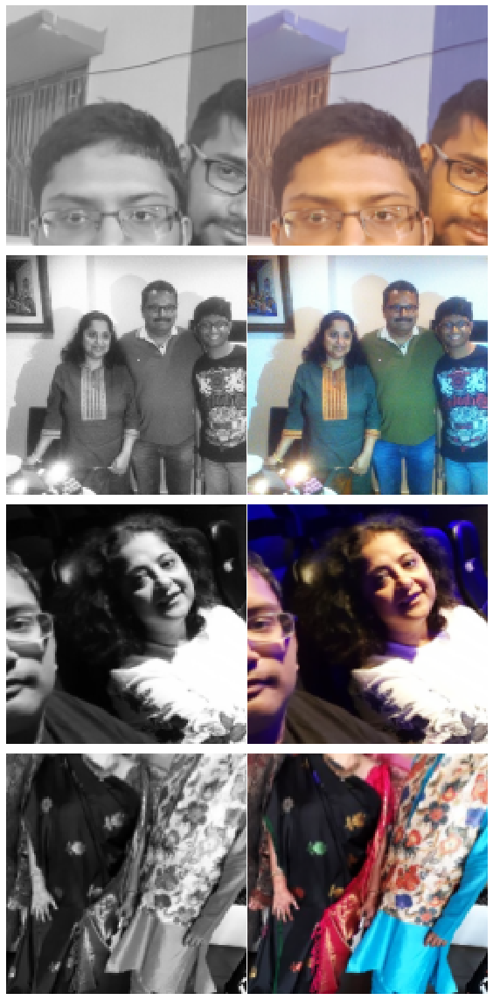

In [81]:
data_gen.show_batch(4)

In [26]:
learn_gen = None
gc.collect()

15161

In [38]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat()
    ,callback_fns=[ShowGraph]
    
).to_fp16()

epoch,train_loss,valid_loss,time
0,3.062953,#na#,00:22
1,3.042318,#na#,00:15
2,2.948922,#na#,00:15
3,2.776500,#na#,00:15
4,2.495875,#na#,00:15
5,2.165366,#na#,00:14
6,1.813608,#na#,00:14
7,1.519880,#na#,00:14
8,1.277273,#na#,00:14


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


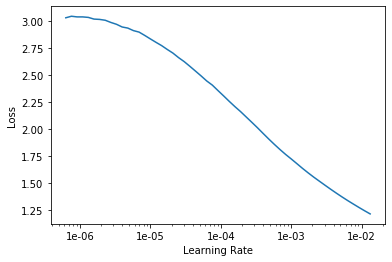

In [23]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,2.525464,2.175235,00:27
1,2.371494,1.756029,00:21
2,2.157659,1.494647,00:22
3,1.956110,1.298818,00:21
4,1.762025,1.104202,00:23
5,1.577337,0.900762,00:20
6,1.413562,0.717326,00:22
7,1.253558,0.581923,00:20
8,1.114333,0.505522,00:18
9,0.997501,0.463829,00:20


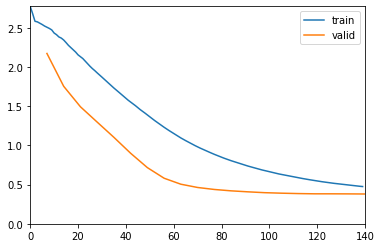

In [28]:
learn_gen.fit_one_cycle(20, 3e-5)

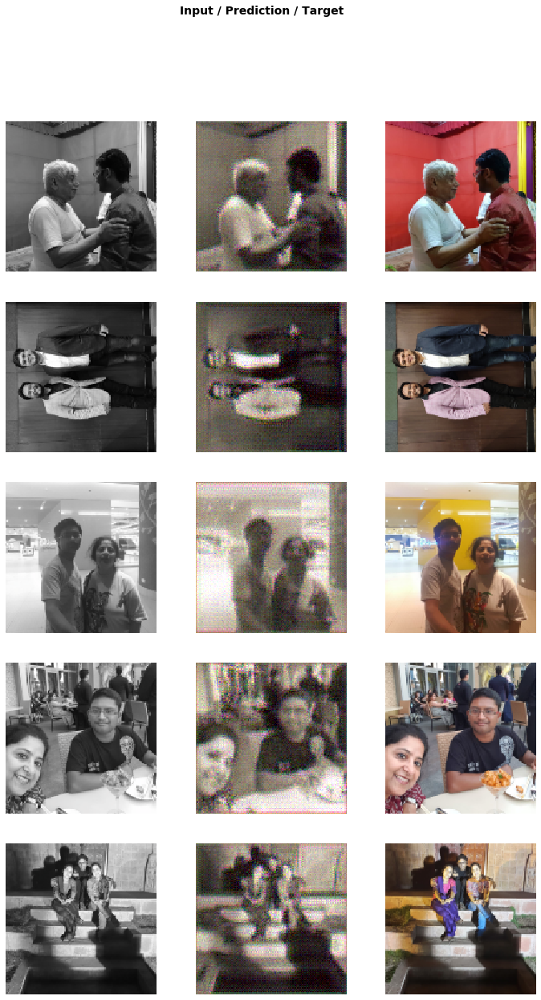

In [29]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.344143,#na#,00:15
1,0.342332,#na#,00:14
2,0.339765,#na#,00:13
3,0.336338,#na#,00:15
4,0.328557,#na#,00:14
5,0.313268,#na#,00:14
6,0.289659,#na#,00:13
7,0.268409,#na#,00:13
8,0.249284,#na#,00:14
9,0.398018,#na#,00:15


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


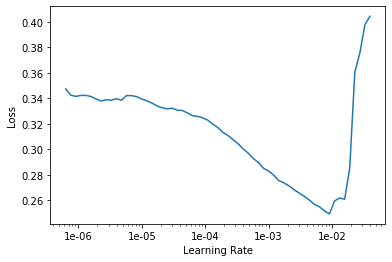

In [30]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,time
0,0.341975,0.379806,00:22
1,0.338693,0.378761,00:19
2,0.336987,0.373276,00:19
3,0.337683,0.368297,00:19
4,0.333808,0.360624,00:21
5,0.327701,0.351401,00:19
6,0.323575,0.340861,00:19
7,0.318694,0.329231,00:20
8,0.312989,0.318482,00:19
9,0.306898,0.307708,00:19


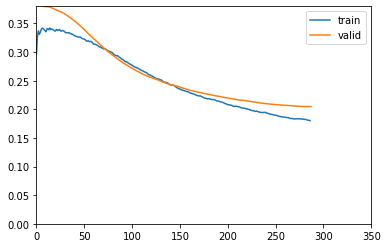

Epoch 40: early stopping


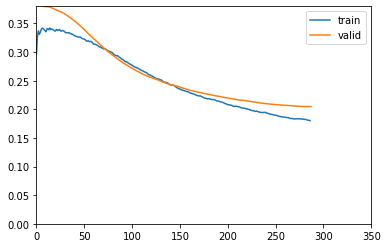

In [31]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(50, 2e-5)

In [32]:
learn_gen.save("stage-1")

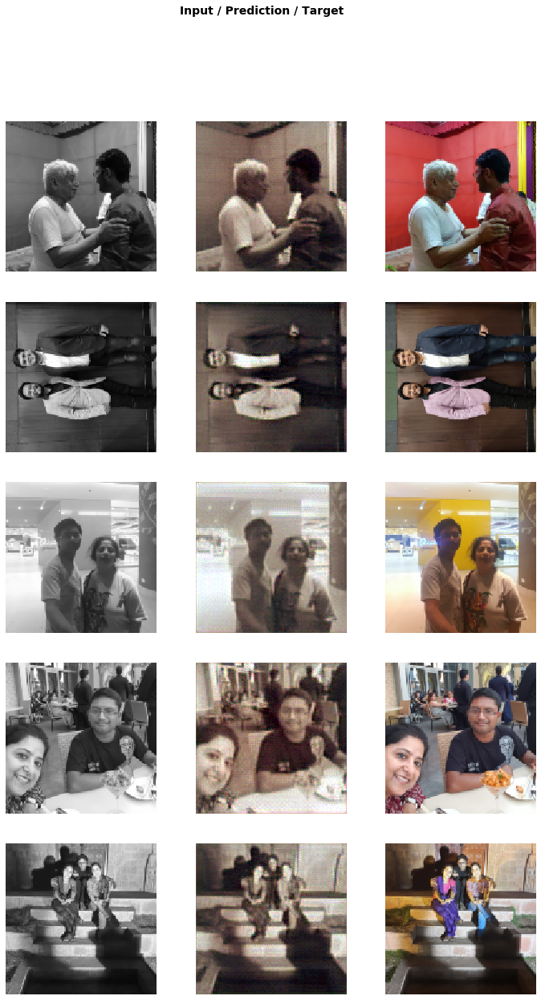

In [33]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.166932,0.205060,00:19
1,0.172618,0.204760,00:19
2,0.169611,0.204354,00:19
3,0.170920,0.204204,00:21
4,0.168476,0.203827,00:22
5,0.168816,0.203246,00:20
6,0.169306,0.202523,00:21
7,0.169155,0.201705,00:19
8,0.169155,0.200723,00:19
9,0.169032,0.199350,00:20


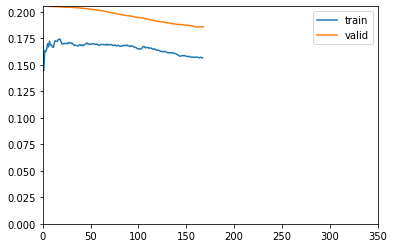

Epoch 23: early stopping


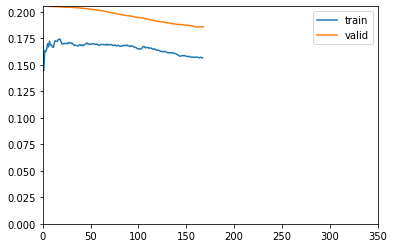

In [34]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(50, 1e-5)

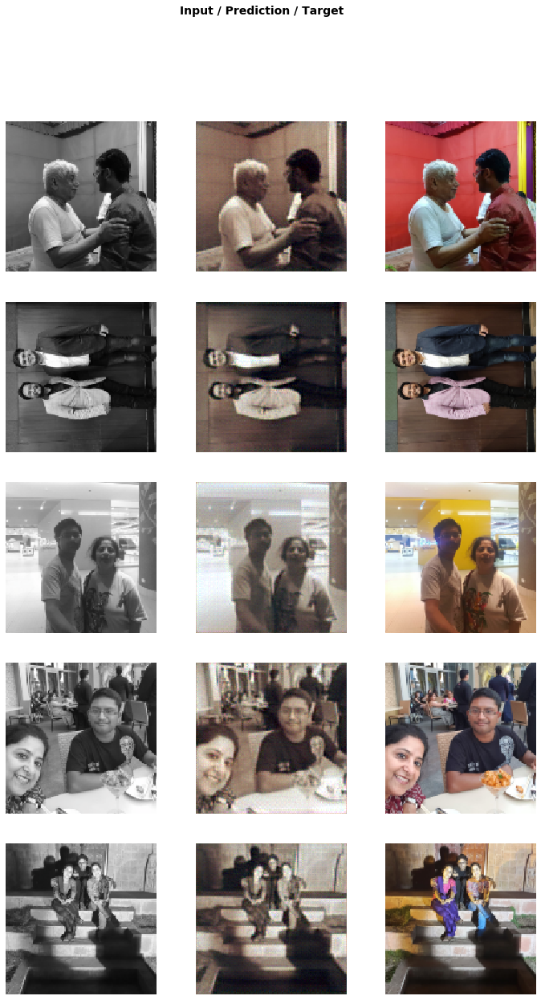

In [35]:
learn_gen.show_results(rows=5)

In [36]:
learn_gen.save("stage-2")

epoch,train_loss,valid_loss,time
0,0.152155,0.185771,00:21
1,0.151549,0.185441,00:20
2,0.152519,0.185510,00:22
3,0.150691,0.185254,00:23
4,0.150969,0.185069,00:22
5,0.151162,0.185324,00:24
6,0.151362,0.184965,00:24
7,0.151320,0.184502,00:22
8,0.151130,0.184408,00:21
9,0.150704,0.184281,00:19


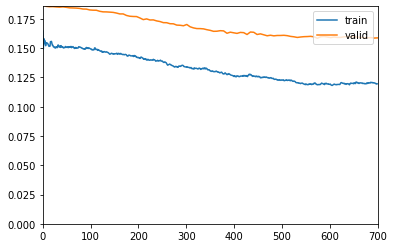

In [41]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 1e-5)

In [42]:
learn_gen.save("stage-3")

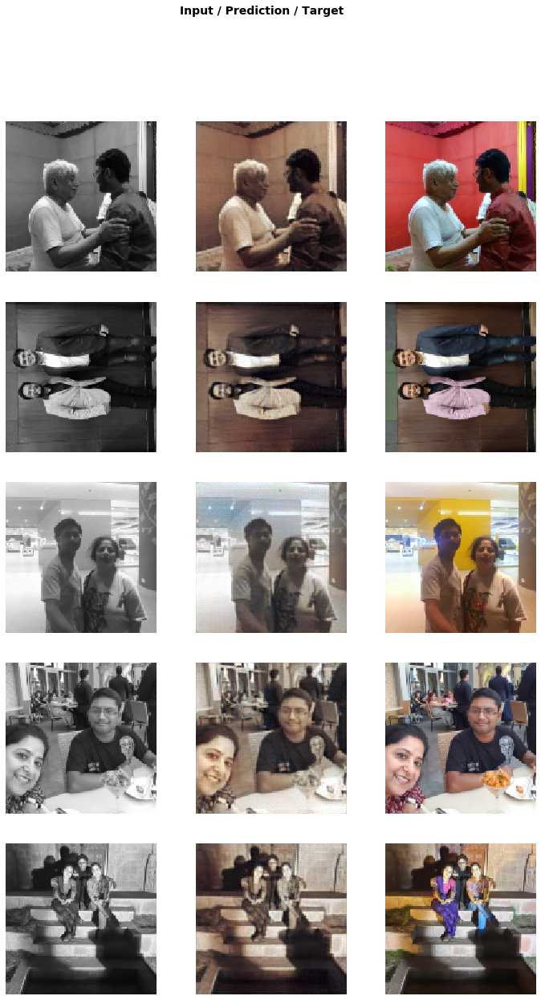

In [43]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.119932,0.158882,00:19
1,0.120418,0.159084,00:20
2,0.120527,0.159110,00:19
3,0.118860,0.159088,00:20
4,0.117934,0.158706,00:20
5,0.117140,0.159159,00:19
6,0.117310,0.159244,00:20
7,0.118018,0.158654,00:20
8,0.119722,0.158955,00:20
9,0.119952,0.159076,00:19


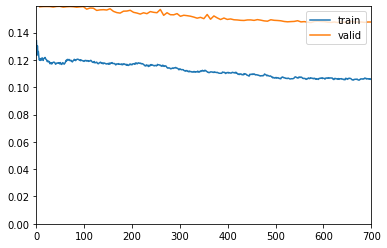

In [44]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 1e-5)

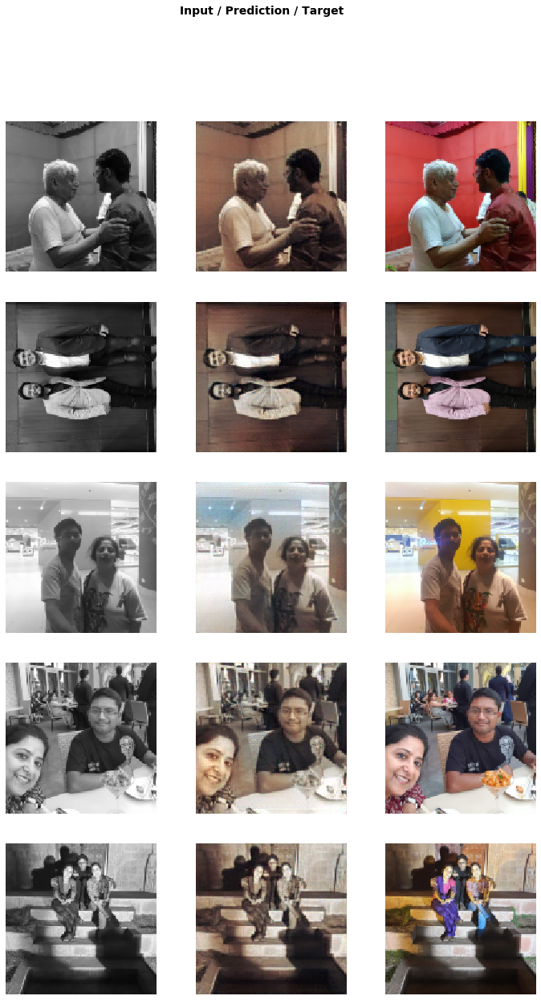

In [45]:
learn_gen.show_results(rows=5)

In [46]:
learn_gen.save('stage-large-1')

In [11]:
data_gen = get_data(64, 128)

In [12]:
learn_gen = None
gc.collect()

440

In [13]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat()
    ,callback_fns=[ShowGraph]
    
).to_fp16()

In [14]:
learn_gen.load('stage-large-1')

Learner(data=ImageDataBunch;

Train: LabelList (253 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/crappy;

Valid: LabelList (63 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/crappy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Basi

epoch,train_loss,valid_loss,time
0,0.112667,0.103924,00:34
1,0.113710,0.103796,00:26
2,0.115542,0.103713,00:27
3,0.117556,0.103605,00:27
4,0.115381,0.103323,00:27
5,0.116488,0.103419,00:27
6,0.116801,0.103135,00:27
7,0.116814,0.103053,00:27
8,0.116182,0.102784,00:24
9,0.115702,0.102510,00:29


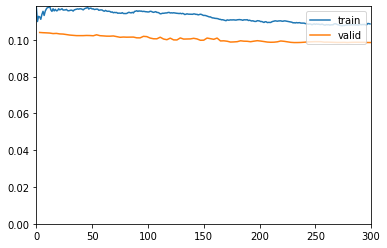

In [15]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 1e-5)

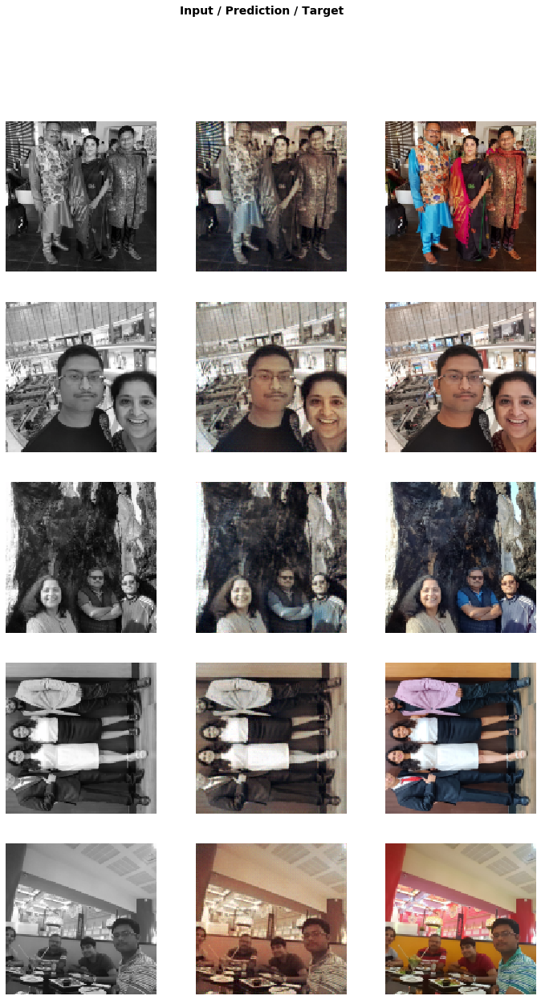

In [16]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.110060,0.098530,00:27
1,0.107697,0.098481,00:26
2,0.108021,0.098387,00:27
3,0.106394,0.098500,00:26
4,0.105923,0.098468,00:29
5,0.107192,0.098427,00:31
6,0.107338,0.098457,00:29
7,0.106686,0.098553,00:28
8,0.106327,0.098840,00:30
9,0.107028,0.099216,00:31


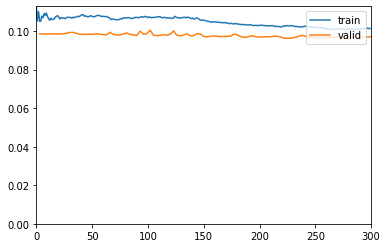

In [17]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 1e-5)

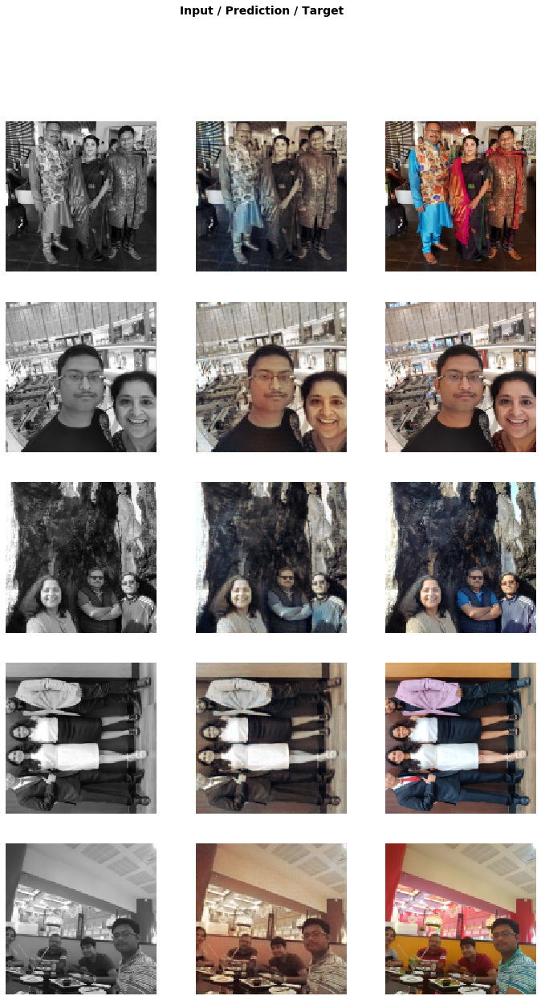

In [18]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.107100,0.096954,00:26
1,0.106322,0.096924,00:30
2,0.104410,0.096989,00:28
3,0.104292,0.096854,00:28
4,0.103200,0.096784,00:29
5,0.103250,0.096775,00:31
6,0.102613,0.096885,00:28
7,0.102102,0.096592,00:28
8,0.102089,0.096456,00:29
9,0.102106,0.096502,00:30


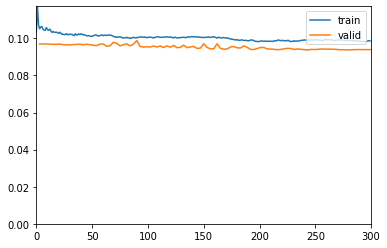

In [19]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 1e-5)

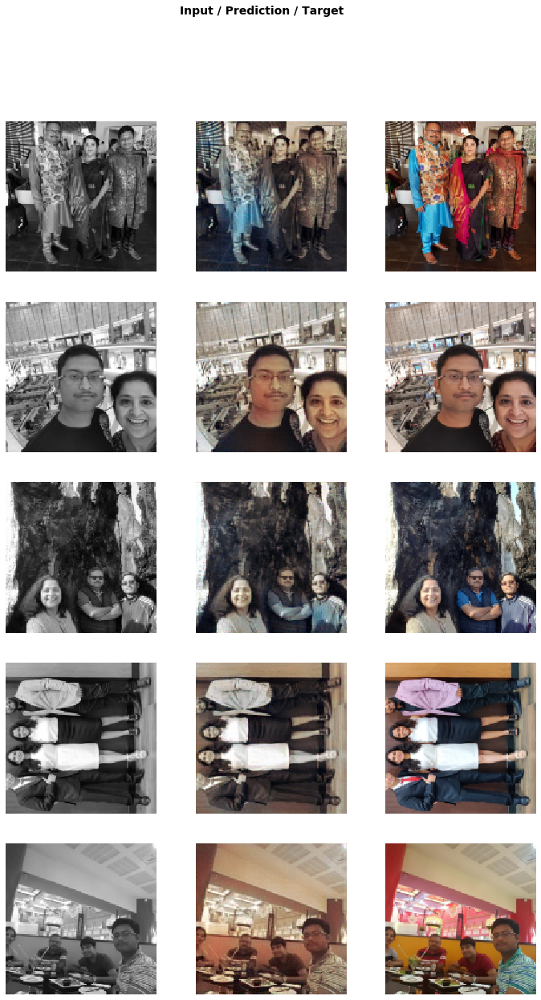

In [20]:
learn_gen.show_results(rows=5)

In [59]:
learn_gen.save('fin')

In [ ]:
learn_gen.save("/home/subhaditya/Downloads/gen-pre3")

In [ ]:
learn_gen.export("/home/subhaditya/Downloads/learner3")

In [ ]:
# learn_gen.unfreeze()

In [ ]:
# learn_gen.fit_one_cycle(3, slice(1e-6,1e-3))

In [ ]:
# learn_gen.show_results(rows=4)

# Transfer with even more data now

In [96]:
data_gen = get_data(64, 128)

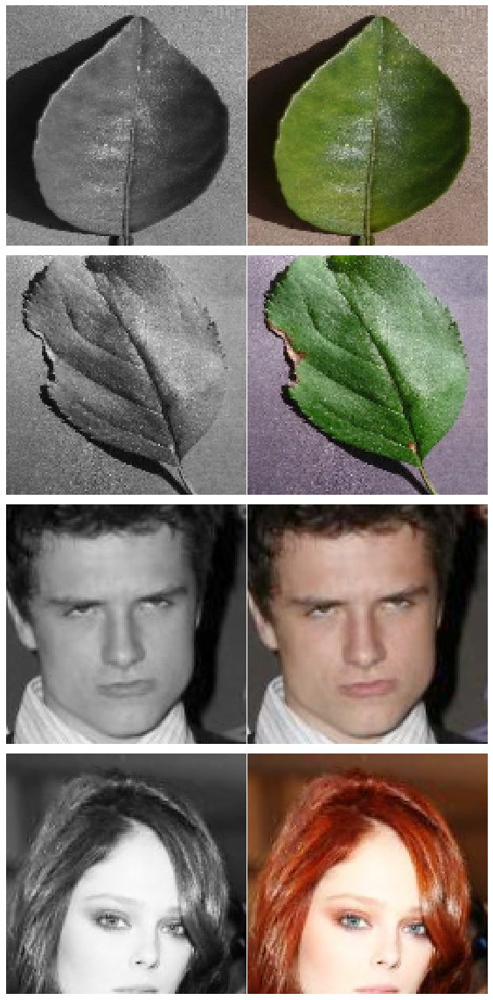

In [97]:
data_gen.show_batch(4)

In [98]:
learn_gen = None
gc.collect()

18530

In [99]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat()
    ,callback_fns=[ShowGraph]
    
).to_fp16()

In [100]:
learn_gen.load('fin')

Learner(data=ImageDataBunch;

Train: LabelList (1535 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/crappy;

Valid: LabelList (383 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/crappy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Ba

epoch,train_loss,valid_loss,time
0,0.139218,0.118490,00:56
1,0.137334,0.114257,00:52
2,0.135234,0.110837,00:52
3,0.131393,0.108226,00:57
4,0.128266,0.106361,00:53
5,0.126153,0.105270,00:52
6,0.124694,0.104301,00:52
7,0.123918,0.104038,00:52
8,0.123041,0.103902,00:52
9,0.120665,0.104130,00:51


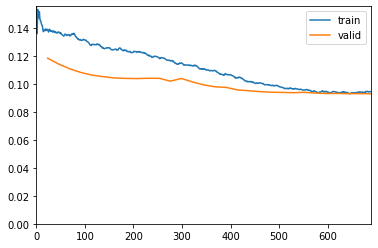

In [101]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(30, 1e-5)

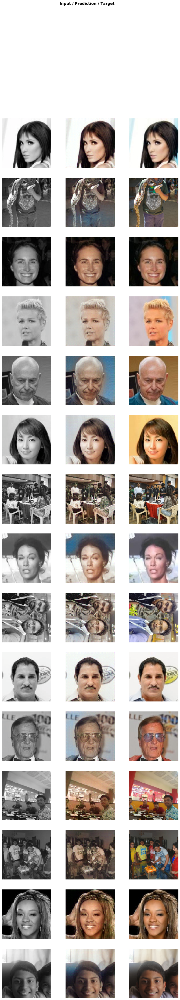

In [141]:
learn_gen.show_results(rows=15)

epoch,train_loss,valid_loss,time
0,0.092595,0.093028,00:53
1,0.094236,0.092051,00:53
2,0.091810,0.092660,00:55
3,0.091070,0.092040,00:52
4,0.090364,0.092096,00:53


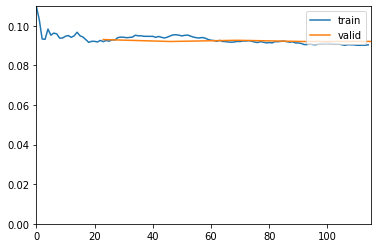

In [139]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(5, 1e-5)

In [ ]:
learn_gen.save('fin-md')

# Test

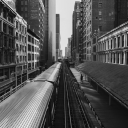

In [142]:
open_image("test.jpg").resize((128))

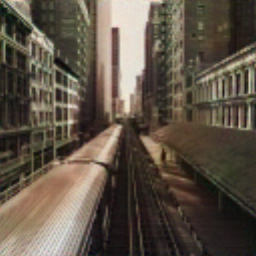

In [143]:
end = learn_gen.predict(open_image("test.jpg").resize((128)))
end[0].resize((256))

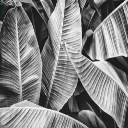

In [144]:
open_image("test2.jpg").resize((128))

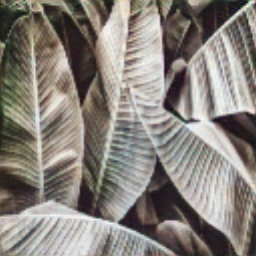

In [145]:
end = learn_gen.predict(open_image("test2.jpg").resize((128)))
end[0].resize((256))

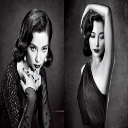

In [146]:
open_image("test3.jpg").resize((128))

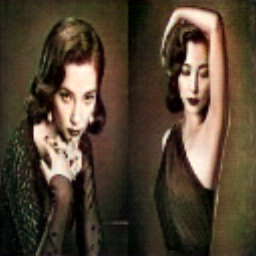

In [147]:
end = learn_gen.predict(open_image("test3.jpg").resize((128)))
end[0].resize((256))

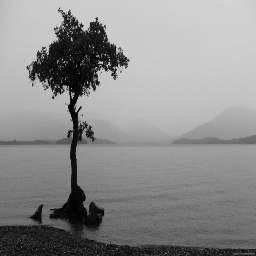

In [148]:
open_image("test4.jpg").resize((256))

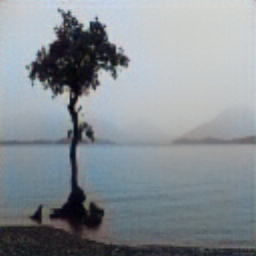

In [149]:
end = learn_gen.predict(open_image("test4.jpg").resize((128)))
end[0].resize((256))

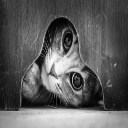

In [150]:
open_image("test5.jpg").resize((128))

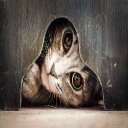

In [151]:
end = learn_gen.predict(open_image("test5.jpg").resize((128)))
end[0].resize((128))

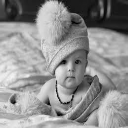

In [152]:
open_image("test6.jpg").resize((128))

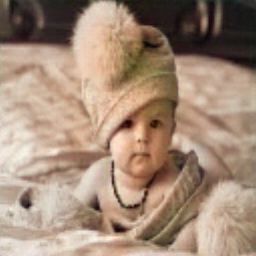

In [153]:
end = learn_gen.predict(open_image("test6.jpg").resize((128)))
end[0].resize((256))

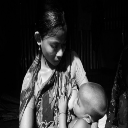

In [154]:
open_image("test7.jpg").resize((128))

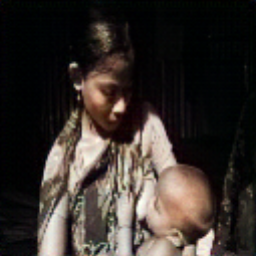

In [155]:
end = learn_gen.predict(open_image("test7.jpg").resize((128)))
end[0].resize((256))

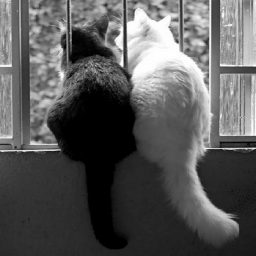

In [156]:
open_image("test8.jpg").resize((256))

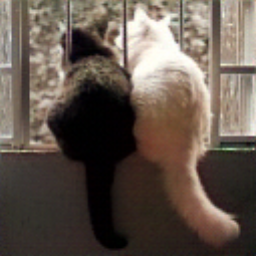

In [157]:
end = learn_gen.predict(open_image("test8.jpg").resize((128)))
end[0].resize((256))

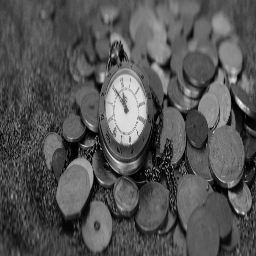

In [158]:
open_image("test9.jpeg").resize((256))

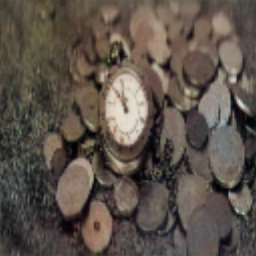

In [159]:
end = learn_gen.predict(open_image("test9.jpeg").resize((128)))
end[0].resize((256))

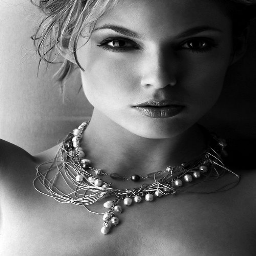

In [160]:
open_image("test11.jpg").resize((256))

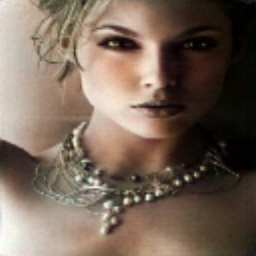

In [161]:
end = learn_gen.predict(open_image("test11.jpg").resize((128)))
end[0].resize((256))

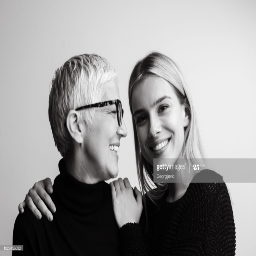

In [162]:
open_image("test14.jpg").resize((256))

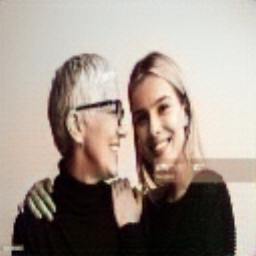

In [163]:
end = learn_gen.predict(open_image("test14.jpg").resize((128)))
end[0].resize((256))

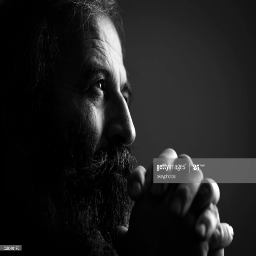

In [164]:
open_image("test15.jpg").resize((256))

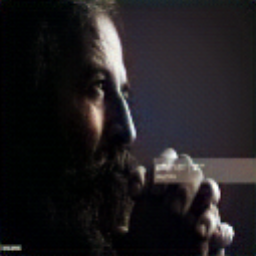

In [165]:
end = learn_gen.predict(open_image("test15.jpg").resize((128)))
end[0].resize((256))

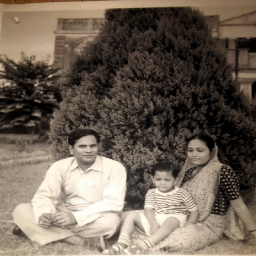

In [166]:
open_image("test16.jpg").resize((256))

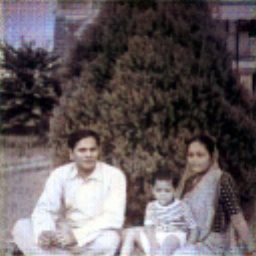

In [167]:
end = learn_gen.predict(open_image("test16.jpg"))
end[0].resize((256))

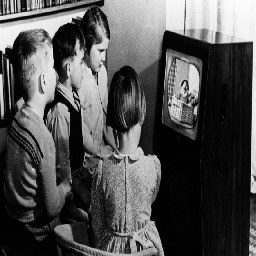

In [168]:
open_image("test17.jpg").resize((256))

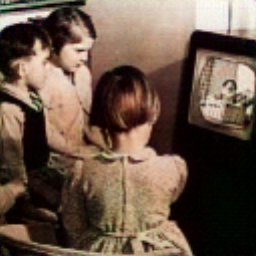

In [169]:
end = learn_gen.predict(open_image("test17.jpg"))
end[0].resize((256))

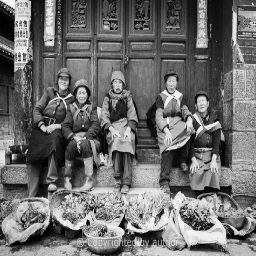

In [171]:
open_image("test18.JPG").resize((256))

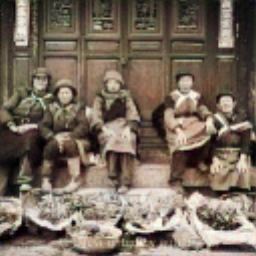

In [172]:
end = learn_gen.predict(open_image("test18.JPG"))
end[0].resize((256))

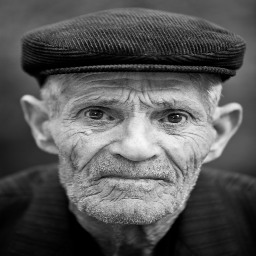

In [173]:
open_image("test19.jpg").resize((256))

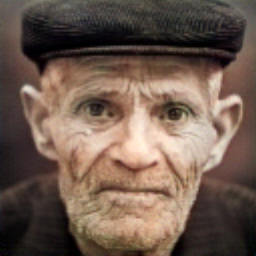

In [174]:
end = learn_gen.predict(open_image("test19.jpg"))
end[0].resize((256))

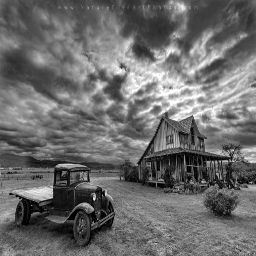

In [175]:
open_image("test20.jpg").resize((256))

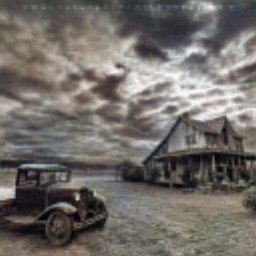

In [177]:
end = learn_gen.predict(open_image("test20.jpg"))
end[0].resize((256))